In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Isso leva aproximadamente 13 minutos pra rodar
# 1. Cria a pasta final no SSD
!mkdir -p /content/agar

# 2. Descompacta DIRETAMENTE do Drive para o SSD
print("Lendo do Drive e descompactando no SSD...")
!tar -xzf "/content/drive/MyDrive/AGAR/raw/AGAR.tar.gz" -C "/content/agar"

print("✅ Dataset descompactado com sucesso!")

Lendo do Drive e descompactando no SSD...
✅ Dataset descompactado com sucesso!


In [ ]:
import json
import os

# 1. Configuração de Caminhos
caminho_base = '/content/agar/dataset' # Ajuste se necessário
caminho_json_original = os.path.join(caminho_base, 'annotations.json')
caminho_json_limpo = os.path.join(caminho_base, 'annotations_sem_incontaveis.json')

# 2. Definição dos Intervalos "Uncountable" (Incontáveis) da sua tabela
intervalos_incontaveis = [
    (1303, 2088),   # Bright
    (8710, 11737),  # Dark
    (12618, 12731), # Vague
    (17418, 18000)  # Lower-resolution
]

def eh_incontavel(image_id):
    """Verifica se o ID da imagem está na zona de exclusão."""
    for inicio, fim in intervalos_incontaveis:
        if inicio <= image_id <= fim:
            return True
    return False

# 3. Processamento do arquivo COCO
print(f"Carregando {caminho_json_original}...")
with open(caminho_json_original, 'r') as f:
    coco = json.load(f)

# Criar listas para o novo dataset filtrado
novas_images = []
novas_annotations = []

# Guardar os IDs das imagens que vamos manter
ids_permitidos = set()

print("Filtrando imagens...")
for img in coco['images']:
    img_id = img['id']

    if not eh_incontavel(img_id):
        novas_images.append(img)
        ids_permitidos.add(img_id)

print(f"Filtrando anotações (mantendo apenas as de imagens permitidas)...")
for ann in coco['annotations']:
    if ann['image_id'] in ids_permitidos:
        novas_annotations.append(ann)

# 4. Criar o novo dicionário COCO
coco_filtrado = {
    "info": coco.get("info", {}),
    "licenses": coco.get("licenses", []),
    "categories": coco.get("categories", []),
    "images": novas_images,
    "annotations": novas_annotations
}

# 5. Salvar o resultado
with open(caminho_json_limpo, 'w') as f:
    json.dump(coco_filtrado, f)

print("="*50)
print(f"RESULTADO DA LIMPEZA:")
print(f"- Imagens originais: {len(coco['images'])}")
print(f"- Imagens removidas: {len(coco['images']) - len(novas_images)}")
print(f"- Imagens mantidas (Contáveis + Vazias): {len(novas_images)}")
print(f"- Novo arquivo salvo em: {caminho_json_limpo}")
print("="*50)

Carregando /content/agar/dataset/annotations.json...
Filtrando imagens...
Filtrando anotações (mantendo apenas as de imagens permitidas)...
RESULTADO DA LIMPEZA:
- Imagens originais: 18000
- Imagens removidas: 4511
- Imagens mantidas (Contáveis + Vazias): 13489
- Novo arquivo salvo em: /content/agar/dataset/annotations_sem_incontaveis.json


In [ ]:
!pip install tdqm opencv-python torch torchvision
!pip install git+https://github.com/facebookresearch/sam2.git

  Preparing metadata (setup.py) ... done
  Created wheel for tdqm: filename=tdqm-0.0.1-py3-none-any.whl size=1322 sha256=000fd1045a40d692400e1a3c5645b89491d3b4af9700407a4bc198c861758793
  Stored in directory: /root/.cache/pip/wheels/af/02/71/aae0f7ee738abf19498353918ddae0f90a0d6ceb337b0bbc91
Successfully built tdqm
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-u_sz96no
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-u_sz96no
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 18.2 MB/s eta 0:00:00
  Created wheel for SAM-2

In [ ]:
# Pipeline completo para geração de máscaras de segmentação no AGAR com SAM2

import os
# Evita fragmentação de memória de GPU
os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"

import json
import gc
import cv2
import torch
import numpy as np
from tqdm import tqdm
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# ==========================================================
# 1. CONFIGURAÇÕES
# ==========================================================
CAMINHO_BASE = '/content/agar/dataset'
CAMINHO_JSON_LIMPO = os.path.join(CAMINHO_BASE, 'annotations_sem_incontaveis.json')
CAMINHO_JSON_FINAL = '/content/drive/MyDrive/AGAR/annotations_agar_segmentado.json'

# Se as imagens estiverem em uma subpasta, altere para:
# DIRETORIO_IMAGENS = os.path.join(CAMINHO_BASE, 'images')
DIRETORIO_IMAGENS = CAMINHO_BASE

SAM2_CHECKPOINT = '/content/drive/MyDrive/SAM2/sam2.1_hiera_large.pt'
MODEL_CFG = 'configs/sam2.1/sam2.1_hiera_l.yaml'

RESUME = True
INTERVALO_SALVAMENTO = 100
TAMANHO_LOTE = 300      # Reduza para 50 ou 20 se houver OOM na GPU
MAX_DIM = 1024          # Redimensiona imagens grandes para economizar RAM/VRAM

# ==========================================================
# 2. FUNÇÕES AUXILIARES
# ==========================================================
def salvar_json_seguro(data, caminho_final):
    """
    Salvamento atômico com backup.

    Fluxo:
    1. Escreve em <arquivo>.tmp
    2. Move o arquivo atual para <arquivo>.bak (se existir)
    3. Substitui atomicamente o arquivo final

    Isso evita corrupção do JSON caso a sessão seja interrompida.
    """
    caminho_tmp = caminho_final + '.tmp'
    caminho_bak = caminho_final + '.bak'

    with open(caminho_tmp, 'w') as f:
        json.dump(data, f)
        f.flush()
        os.fsync(f.fileno())

    if os.path.exists(caminho_final):
        os.replace(caminho_final, caminho_bak)

    os.replace(caminho_tmp, caminho_final)


def carregar_json_com_fallback(caminho_principal, caminho_original=None):
    """
    Tenta carregar o JSON principal.
    Se estiver corrompido, tenta o backup (.bak).
    Se não houver backup, carrega o arquivo original (se informado).
    """
    try:
        with open(caminho_principal, 'r') as f:
            return json.load(f)
    except json.JSONDecodeError:
        print('⚠️ Arquivo principal corrompido. Tentando backup...')

        caminho_bak = caminho_principal + '.bak'
        if os.path.exists(caminho_bak):
            with open(caminho_bak, 'r') as f:
                data = json.load(f)
            print('✅ Backup carregado com sucesso.')
            return data

        if caminho_original is not None:
            print('⚠️ Backup não encontrado. Carregando arquivo original...')
            with open(caminho_original, 'r') as f:
                return json.load(f)

        raise


def coco_to_sam_bbox(bbox):
    """COCO [x, y, w, h] -> SAM [x1, y1, x2, y2]."""
    x, y, w, h = bbox
    return [x, y, x + w, y + h]



def mask_to_polygon(mask):
    """Converte máscara binária em polígonos no formato COCO."""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(
        mask_uint8,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    segmentation = []

    for contour in contours:
        if len(contour) >= 3:
            polygon = contour.flatten().astype(float).tolist()
            if len(polygon) >= 6:
                segmentation.append(polygon)

    return segmentation



def resize_image_and_boxes(image, boxes, max_dim=1024):
    """
    Redimensiona imagens grandes e ajusta bounding boxes.
    Retorna: imagem_redimensionada, boxes_redimensionadas, scale
    """
    h, w = image.shape[:2]
    max_current_dim = max(h, w)

    if max_current_dim <= max_dim:
        return image, boxes, 1.0

    scale = max_dim / max_current_dim

    new_w = int(round(w * scale))
    new_h = int(round(h * scale))

    resized_image = cv2.resize(
        image,
        (new_w, new_h),
        interpolation=cv2.INTER_AREA
    )

    resized_boxes = boxes.astype(np.float32) * scale

    return resized_image, resized_boxes, scale



def scale_segmentation_back(segmentation, scale):
    """Reescala os polígonos para o tamanho original da imagem."""
    if scale == 1.0:
        return segmentation

    inv_scale = 1.0 / scale
    scaled_seg = []

    for polygon in segmentation:
        scaled_polygon = [float(coord * inv_scale) for coord in polygon]
        scaled_seg.append(scaled_polygon)

    return scaled_seg



def reset_predictor_safe(predictor):
    """Libera embeddings internos do SAM2."""
    if hasattr(predictor, 'reset_predictor'):
        predictor.reset_predictor()
    elif hasattr(predictor, 'reset_image'):
        predictor.reset_image()


# ==========================================================
# 3. INICIALIZAÇÃO DO MODELO
# ==========================================================
print('🚀 Carregando SAM 2.1 Hiera Large...')

if torch.cuda.is_available():
    device = 'cuda'
elif getattr(torch.backends, 'mps', None) is not None and torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'

print(f'🖥️ Device: {device}')

model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=device)
predictor = SAM2ImagePredictor(model)


# ==========================================================
# 4. CARREGAMENTO DO JSON (NOVO OU RESUME)
# ==========================================================
usando_resume = RESUME and os.path.exists(CAMINHO_JSON_FINAL)

if usando_resume:
    print(f'🔄 Retomando processamento: {CAMINHO_JSON_FINAL}')
    coco_data = carregar_json_com_fallback(
        CAMINHO_JSON_FINAL,
        caminho_original=CAMINHO_JSON_LIMPO
    )
else:
    print(f'📄 Iniciando novo processamento: {CAMINHO_JSON_LIMPO}')
    with open(CAMINHO_JSON_LIMPO, 'r') as f:
        coco_data = json.load(f)


# ==========================================================
# 5. INDEXAÇÃO DAS ANOTAÇÕES
# ==========================================================
# Uma imagem é considerada concluída SOMENTE se TODAS as suas
# anotações tiverem sam_processed=True.

img_to_anns = {}

# Agrupa anotações por image_id
for ann in coco_data['annotations']:
    img_id = ann['image_id']
    img_to_anns.setdefault(img_id, []).append(ann)

# Identifica imagens totalmente processadas
imagens_processadas = set()

for img_id, anns in img_to_anns.items():
    if len(anns) > 0 and all(
        ann.get('sam_processed') is True
        for ann in anns
    ):
        imagens_processadas.add(img_id)

print(f'📊 Total de imagens no JSON: {len(coco_data["images"])}')
print(f'✅ Imagens totalmente processadas (pular): {len(imagens_processadas)}')

total_annotations = len(coco_data['annotations'])
annotations_processadas = sum(
    1
    for ann in coco_data['annotations']
    if ann.get('sam_processed') is True
)

print(
    f'📝 Anotações processadas: '
    f'{annotations_processadas:,}/{total_annotations:,}'
)

imagens_pendentes = len(coco_data['images']) - len(imagens_processadas)
print(f'⏳ Imagens ainda pendentes: {imagens_pendentes:,}')


# ==========================================================
# 6. LOOP PRINCIPAL
# ==========================================================
imagens_processadas_nesta_sessao = 0
erros_caminho_imagem = 0
erros_processamento = 0

for img_info in tqdm(coco_data['images']):
    img_id = img_info['id']

    if img_id in imagens_processadas:
        continue

    anns_da_imagem = img_to_anns.get(img_id, [])
    if not anns_da_imagem:
        continue

    file_name = img_info['file_name']
    caminho_img = os.path.join(DIRETORIO_IMAGENS, file_name)

    if not os.path.exists(caminho_img):
        erros_caminho_imagem += 1
        continue

    try:
        # --------------------------------------------------
        # Carregamento da imagem
        # --------------------------------------------------
        image_bgr = cv2.imread(caminho_img)
        if image_bgr is None:
            erros_processamento += 1
            continue

        image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # Bounding boxes em formato SAM
        input_boxes = np.array(
            [coco_to_sam_bbox(ann['bbox']) for ann in anns_da_imagem],
            dtype=np.float32
        )

        # Redimensionamento para economizar memória
        image_resized, boxes_resized, scale = resize_image_and_boxes(
            image,
            input_boxes,
            max_dim=MAX_DIM
        )

        # Gera embeddings da imagem
        predictor.set_image(image_resized)

        # --------------------------------------------------
        # Predição em lotes
        # --------------------------------------------------
        idx_ann_global = 0

        for j in range(0, len(boxes_resized), TAMANHO_LOTE):
            lote_boxes = boxes_resized[j:j + TAMANHO_LOTE]

            if device == 'cuda':
                with torch.inference_mode(), torch.autocast('cuda', dtype=torch.bfloat16):
                    masks_lote, _, _ = predictor.predict(
                        box=lote_boxes,
                        multimask_output=False
                    )
            else:
                with torch.inference_mode():
                    masks_lote, _, _ = predictor.predict(
                        box=lote_boxes,
                        multimask_output=False
                    )

            # Ajuste de dimensões
            if masks_lote.ndim == 4:
                # [N, 1, H, W] -> [N, H, W]
                masks_lote = masks_lote[:, 0, :, :]
            elif masks_lote.ndim == 2:
                # [H, W] -> [1, H, W]
                masks_lote = np.expand_dims(masks_lote, axis=0)

            # --------------------------------------------------
            # Converte cada máscara em polígonos imediatamente
            # --------------------------------------------------
            for k in range(len(masks_lote)):
                mask_binaria = masks_lote[k]
                segmentation = mask_to_polygon(mask_binaria)

                ann = anns_da_imagem[idx_ann_global]

                if segmentation:
                    segmentation = scale_segmentation_back(segmentation, scale)
                    ann['segmentation'] = segmentation
                    ann['area'] = float(np.sum(mask_binaria) / (scale * scale))
                else:
                    # Fallback: usa a própria bounding box como polígono
                    x, y, w, h = ann['bbox']
                    ann['segmentation'] = [[
                        float(x), float(y),
                        float(x + w), float(y),
                        float(x + w), float(y + h),
                        float(x), float(y + h)
                    ]]
                    ann['area'] = float(w * h)

                ann['iscrowd'] = 0
                ann['sam_processed'] = True

                idx_ann_global += 1

            # Limpeza de memória do lote atual
            del masks_lote
            if device == 'cuda':
                torch.cuda.empty_cache()
            gc.collect()

        # --------------------------------------------------
        # Imagem concluída
        # --------------------------------------------------
        imagens_processadas_nesta_sessao += 1
        imagens_processadas.add(img_id)

        # --------------------------------------------------
        # Salvamento periódico
        # --------------------------------------------------
        if imagens_processadas_nesta_sessao % INTERVALO_SALVAMENTO == 0:
            print(
                f'\n💾 Checkpoint: '
                f'{imagens_processadas_nesta_sessao} imagens processadas nesta sessão.'
            )
            salvar_json_seguro(coco_data, CAMINHO_JSON_FINAL)

    except RuntimeError as e:
        print(f'\n⚠️ Erro ao processar {file_name}: {e}')
        erros_processamento += 1

    except Exception as e:
        print(f'\n⚠️ Erro inesperado ao processar {file_name}: {e}')
        erros_processamento += 1

    finally:
        # --------------------------------------------------
        # Liberação de memória
        # --------------------------------------------------
        try:
            reset_predictor_safe(predictor)
        except Exception:
            pass

        for var_name in [
            'image_bgr',
            'image',
            'image_resized',
            'input_boxes',
            'boxes_resized',
            'lote_boxes',
            'mask_binaria',
            'segmentation'
        ]:
            if var_name in locals():
                try:
                    del locals()[var_name]
                except Exception:
                    pass

        if device == 'cuda':
            torch.cuda.empty_cache()

        gc.collect()


# ==========================================================
# 7. SALVAMENTO FINAL
# ==========================================================
if imagens_processadas_nesta_sessao > 0:
    print(f'\n🎉 Salvamento final em: {CAMINHO_JSON_FINAL}')
    salvar_json_seguro(coco_data, CAMINHO_JSON_FINAL)
    print('✅ Processo concluído.')
else:
    print('\n✅ Nenhuma nova imagem precisou ser processada.')


# ==========================================================
# 8. RELATÓRIO FINAL
# ==========================================================
if erros_caminho_imagem > 0:
    print(
        f'⚠️ {erros_caminho_imagem} imagens não encontradas em '
        f'{DIRETORIO_IMAGENS}.'
    )

if erros_processamento > 0:
    print(
        f'⚠️ {erros_processamento} imagens tiveram erro de processamento '
        f'e foram puladas.'
    )

print(f'📌 Total processado nesta sessão: {imagens_processadas_nesta_sessao}')
print(f'📌 Arquivo principal: {CAMINHO_JSON_FINAL}')
print(f'📌 Backup automático: {CAMINHO_JSON_FINAL}.bak')


🚀 Carregando SAM 2.1 Hiera Large...
🖥️ Device: cuda
🔄 Retomando processamento: /content/drive/MyDrive/AGAR/annotations_agar_segmentado.json
📊 Total de imagens no JSON: 13489
✅ Imagens totalmente processadas (pular): 1767
📝 Anotações processadas: 65,966/337,497
⏳ Imagens ainda pendentes: 11,722


 21%|██        | 2798/13489 [04:28<7:59:58,  2.69s/it]


💾 Checkpoint: 100 imagens processadas nesta sessão.


 21%|██▏       | 2898/13489 [09:09<8:32:02,  2.90s/it]


💾 Checkpoint: 200 imagens processadas nesta sessão.


 22%|██▏       | 2998/13489 [13:56<7:45:08,  2.66s/it]


💾 Checkpoint: 300 imagens processadas nesta sessão.


 23%|██▎       | 3098/13489 [18:40<7:40:52,  2.66s/it]


💾 Checkpoint: 400 imagens processadas nesta sessão.


 24%|██▎       | 3198/13489 [23:23<7:32:38,  2.64s/it]


💾 Checkpoint: 500 imagens processadas nesta sessão.


 24%|██▍       | 3298/13489 [28:11<7:28:49,  2.64s/it]


💾 Checkpoint: 600 imagens processadas nesta sessão.


 25%|██▌       | 3398/13489 [32:55<7:39:02,  2.73s/it]


💾 Checkpoint: 700 imagens processadas nesta sessão.


 26%|██▌       | 3498/13489 [37:45<7:49:51,  2.82s/it]


💾 Checkpoint: 800 imagens processadas nesta sessão.


 27%|██▋       | 3598/13489 [42:33<7:24:45,  2.70s/it]


💾 Checkpoint: 900 imagens processadas nesta sessão.


 27%|██▋       | 3698/13489 [47:22<7:32:45,  2.77s/it]


💾 Checkpoint: 1000 imagens processadas nesta sessão.


 28%|██▊       | 3798/13489 [52:19<7:26:29,  2.76s/it]


💾 Checkpoint: 1100 imagens processadas nesta sessão.


 29%|██▉       | 3898/13489 [57:11<7:13:41,  2.71s/it]


💾 Checkpoint: 1200 imagens processadas nesta sessão.


 30%|██▉       | 3998/13489 [1:02:02<7:19:04,  2.78s/it]


💾 Checkpoint: 1300 imagens processadas nesta sessão.


 30%|███       | 4098/13489 [1:06:52<7:14:53,  2.78s/it]


💾 Checkpoint: 1400 imagens processadas nesta sessão.


 31%|███       | 4198/13489 [1:11:41<6:56:23,  2.69s/it]


💾 Checkpoint: 1500 imagens processadas nesta sessão.


 32%|███▏      | 4298/13489 [1:16:34<7:19:02,  2.87s/it]


💾 Checkpoint: 1600 imagens processadas nesta sessão.


 33%|███▎      | 4398/13489 [1:21:31<7:03:57,  2.80s/it]


💾 Checkpoint: 1700 imagens processadas nesta sessão.


 33%|███▎      | 4498/13489 [1:26:29<7:26:10,  2.98s/it]


💾 Checkpoint: 1800 imagens processadas nesta sessão.


 34%|███▍      | 4598/13489 [1:31:22<6:49:45,  2.77s/it]


💾 Checkpoint: 1900 imagens processadas nesta sessão.


 35%|███▍      | 4698/13489 [1:36:13<6:37:47,  2.71s/it]


💾 Checkpoint: 2000 imagens processadas nesta sessão.


 36%|███▌      | 4798/13489 [1:41:09<6:58:40,  2.89s/it]


💾 Checkpoint: 2100 imagens processadas nesta sessão.


 36%|███▋      | 4898/13489 [1:46:10<6:40:02,  2.79s/it]


💾 Checkpoint: 2200 imagens processadas nesta sessão.


 37%|███▋      | 4998/13489 [1:51:12<6:35:05,  2.79s/it]


💾 Checkpoint: 2300 imagens processadas nesta sessão.


 38%|███▊      | 5098/13489 [1:56:15<6:25:45,  2.76s/it]


💾 Checkpoint: 2400 imagens processadas nesta sessão.


 39%|███▊      | 5198/13489 [2:01:22<6:31:00,  2.83s/it]


💾 Checkpoint: 2500 imagens processadas nesta sessão.


 39%|███▉      | 5298/13489 [2:06:27<6:58:22,  3.06s/it]


💾 Checkpoint: 2600 imagens processadas nesta sessão.


 40%|████      | 5398/13489 [2:11:28<6:42:26,  2.98s/it]


💾 Checkpoint: 2700 imagens processadas nesta sessão.


 41%|████      | 5498/13489 [2:16:32<6:13:51,  2.81s/it]


💾 Checkpoint: 2800 imagens processadas nesta sessão.


 42%|████▏     | 5598/13489 [2:21:34<6:39:52,  3.04s/it]


💾 Checkpoint: 2900 imagens processadas nesta sessão.


 42%|████▏     | 5698/13489 [2:26:43<6:09:14,  2.84s/it]


💾 Checkpoint: 3000 imagens processadas nesta sessão.


 43%|████▎     | 5798/13489 [2:31:53<6:26:39,  3.02s/it]


💾 Checkpoint: 3100 imagens processadas nesta sessão.


 44%|████▎     | 5898/13489 [2:36:59<5:56:18,  2.82s/it]


💾 Checkpoint: 3200 imagens processadas nesta sessão.


 44%|████▍     | 5998/13489 [2:42:07<5:43:51,  2.75s/it]


💾 Checkpoint: 3300 imagens processadas nesta sessão.


 45%|████▌     | 6098/13489 [2:47:14<6:02:18,  2.94s/it]


💾 Checkpoint: 3400 imagens processadas nesta sessão.


 46%|████▌     | 6198/13489 [2:52:27<6:11:46,  3.06s/it]


💾 Checkpoint: 3500 imagens processadas nesta sessão.


 47%|████▋     | 6298/13489 [2:57:35<5:34:22,  2.79s/it]


💾 Checkpoint: 3600 imagens processadas nesta sessão.


 47%|████▋     | 6398/13489 [3:02:52<5:32:30,  2.81s/it]


💾 Checkpoint: 3700 imagens processadas nesta sessão.


 48%|████▊     | 6498/13489 [3:08:02<6:05:59,  3.14s/it]


💾 Checkpoint: 3800 imagens processadas nesta sessão.


 49%|████▉     | 6598/13489 [3:13:14<5:28:01,  2.86s/it]


💾 Checkpoint: 3900 imagens processadas nesta sessão.


 50%|████▉     | 6698/13489 [3:18:23<5:27:46,  2.90s/it]


💾 Checkpoint: 4000 imagens processadas nesta sessão.


 50%|█████     | 6798/13489 [3:23:33<5:24:03,  2.91s/it]


💾 Checkpoint: 4100 imagens processadas nesta sessão.


 51%|█████     | 6898/13489 [3:28:45<5:17:03,  2.89s/it]


💾 Checkpoint: 4200 imagens processadas nesta sessão.


 52%|█████▏    | 6998/13489 [3:34:03<5:25:22,  3.01s/it]


💾 Checkpoint: 4300 imagens processadas nesta sessão.


 53%|█████▎    | 7098/13489 [3:39:20<5:32:48,  3.12s/it]


💾 Checkpoint: 4400 imagens processadas nesta sessão.


 53%|█████▎    | 7198/13489 [3:44:39<5:01:53,  2.88s/it]


💾 Checkpoint: 4500 imagens processadas nesta sessão.


 54%|█████▍    | 7298/13489 [3:49:52<4:57:22,  2.88s/it]


💾 Checkpoint: 4600 imagens processadas nesta sessão.


 55%|█████▍    | 7398/13489 [3:55:08<5:16:13,  3.11s/it]


💾 Checkpoint: 4700 imagens processadas nesta sessão.


 56%|█████▌    | 7498/13489 [4:00:25<4:48:51,  2.89s/it]


💾 Checkpoint: 4800 imagens processadas nesta sessão.


 56%|█████▋    | 7598/13489 [4:05:42<4:47:52,  2.93s/it]


💾 Checkpoint: 4900 imagens processadas nesta sessão.


 57%|█████▋    | 7698/13489 [4:11:01<4:58:00,  3.09s/it]


💾 Checkpoint: 5000 imagens processadas nesta sessão.


 58%|█████▊    | 7798/13489 [4:16:23<4:51:48,  3.08s/it]


💾 Checkpoint: 5100 imagens processadas nesta sessão.


 59%|█████▊    | 7898/13489 [4:21:46<4:36:56,  2.97s/it]


💾 Checkpoint: 5200 imagens processadas nesta sessão.


 59%|█████▉    | 8021/13489 [4:27:08<4:29:20,  2.96s/it]


💾 Checkpoint: 5300 imagens processadas nesta sessão.


 60%|██████    | 8121/13489 [4:32:27<4:25:24,  2.97s/it]


💾 Checkpoint: 5400 imagens processadas nesta sessão.


 61%|██████    | 8221/13489 [4:37:45<4:20:40,  2.97s/it]


💾 Checkpoint: 5500 imagens processadas nesta sessão.


 62%|██████▏   | 8321/13489 [4:43:07<4:15:48,  2.97s/it]


💾 Checkpoint: 5600 imagens processadas nesta sessão.


 62%|██████▏   | 8421/13489 [4:48:30<4:14:34,  3.01s/it]


💾 Checkpoint: 5700 imagens processadas nesta sessão.


 63%|██████▎   | 8521/13489 [4:53:51<3:59:23,  2.89s/it]


💾 Checkpoint: 5800 imagens processadas nesta sessão.


 64%|██████▍   | 8621/13489 [4:59:13<4:00:49,  2.97s/it]


💾 Checkpoint: 5900 imagens processadas nesta sessão.


 65%|██████▍   | 8721/13489 [5:04:36<3:50:56,  2.91s/it]


💾 Checkpoint: 6000 imagens processadas nesta sessão.


 67%|██████▋   | 9083/13489 [5:09:57<1:59:44,  1.63s/it]


💾 Checkpoint: 6100 imagens processadas nesta sessão.


 68%|██████▊   | 9183/13489 [5:15:11<3:30:56,  2.94s/it]


💾 Checkpoint: 6200 imagens processadas nesta sessão.


 69%|██████▉   | 9283/13489 [5:20:25<3:21:29,  2.87s/it]


💾 Checkpoint: 6300 imagens processadas nesta sessão.


 70%|██████▉   | 9383/13489 [5:25:39<3:15:08,  2.85s/it]


💾 Checkpoint: 6400 imagens processadas nesta sessão.


 70%|███████   | 9483/13489 [5:30:53<3:13:00,  2.89s/it]


💾 Checkpoint: 6500 imagens processadas nesta sessão.


 71%|███████   | 9583/13489 [5:36:06<3:05:27,  2.85s/it]


💾 Checkpoint: 6600 imagens processadas nesta sessão.


 72%|███████▏  | 9683/13489 [5:41:20<3:02:15,  2.87s/it]


💾 Checkpoint: 6700 imagens processadas nesta sessão.


 73%|███████▎  | 9783/13489 [5:46:35<3:01:23,  2.94s/it]


💾 Checkpoint: 6800 imagens processadas nesta sessão.


 73%|███████▎  | 9883/13489 [5:51:52<2:59:58,  2.99s/it]


💾 Checkpoint: 6900 imagens processadas nesta sessão.


 74%|███████▍  | 9983/13489 [5:57:09<2:49:00,  2.89s/it]


💾 Checkpoint: 7000 imagens processadas nesta sessão.


 75%|███████▍  | 10083/13489 [6:02:29<2:50:31,  3.00s/it]


💾 Checkpoint: 7100 imagens processadas nesta sessão.


 75%|███████▌  | 10183/13489 [6:07:49<2:39:05,  2.89s/it]


💾 Checkpoint: 7200 imagens processadas nesta sessão.


 76%|███████▌  | 10283/13489 [6:13:08<2:38:19,  2.96s/it]


💾 Checkpoint: 7300 imagens processadas nesta sessão.


 77%|███████▋  | 10383/13489 [6:18:27<2:28:26,  2.87s/it]


💾 Checkpoint: 7400 imagens processadas nesta sessão.


 78%|███████▊  | 10483/13489 [6:23:46<2:25:20,  2.90s/it]


💾 Checkpoint: 7500 imagens processadas nesta sessão.


 78%|███████▊  | 10583/13489 [6:29:08<2:21:52,  2.93s/it]


💾 Checkpoint: 7600 imagens processadas nesta sessão.


 79%|███████▉  | 10683/13489 [6:34:32<2:19:21,  2.98s/it]


💾 Checkpoint: 7700 imagens processadas nesta sessão.


 80%|███████▉  | 10783/13489 [6:39:58<2:16:56,  3.04s/it]


💾 Checkpoint: 7800 imagens processadas nesta sessão.


 81%|████████  | 10883/13489 [6:45:26<2:07:47,  2.94s/it]


💾 Checkpoint: 7900 imagens processadas nesta sessão.


 81%|████████▏ | 10983/13489 [6:50:56<2:03:54,  2.97s/it]


💾 Checkpoint: 8000 imagens processadas nesta sessão.


 82%|████████▏ | 11083/13489 [6:56:31<1:57:22,  2.93s/it]


💾 Checkpoint: 8100 imagens processadas nesta sessão.


 83%|████████▎ | 11183/13489 [7:02:07<1:57:23,  3.05s/it]


💾 Checkpoint: 8200 imagens processadas nesta sessão.


 84%|████████▎ | 11283/13489 [7:07:49<1:49:04,  2.97s/it]


💾 Checkpoint: 8300 imagens processadas nesta sessão.


 84%|████████▍ | 11383/13489 [7:13:38<1:45:31,  3.01s/it]


💾 Checkpoint: 8400 imagens processadas nesta sessão.


 85%|████████▌ | 11483/13489 [7:19:29<1:44:31,  3.13s/it]


💾 Checkpoint: 8500 imagens processadas nesta sessão.


 86%|████████▌ | 11583/13489 [7:25:24<1:34:27,  2.97s/it]


💾 Checkpoint: 8600 imagens processadas nesta sessão.


 87%|████████▋ | 11683/13489 [7:31:23<1:35:07,  3.16s/it]


💾 Checkpoint: 8700 imagens processadas nesta sessão.


 87%|████████▋ | 11783/13489 [7:37:26<1:26:18,  3.04s/it]


💾 Checkpoint: 8800 imagens processadas nesta sessão.


 88%|████████▊ | 11883/13489 [7:43:38<1:20:50,  3.02s/it]


💾 Checkpoint: 8900 imagens processadas nesta sessão.


 89%|████████▉ | 11983/13489 [7:49:51<1:14:46,  2.98s/it]


💾 Checkpoint: 9000 imagens processadas nesta sessão.


 90%|████████▉ | 12083/13489 [7:56:04<1:10:54,  3.03s/it]


💾 Checkpoint: 9100 imagens processadas nesta sessão.


 90%|█████████ | 12183/13489 [8:02:18<1:04:39,  2.97s/it]


💾 Checkpoint: 9200 imagens processadas nesta sessão.


 91%|█████████ | 12283/13489 [8:08:28<1:00:50,  3.03s/it]


💾 Checkpoint: 9300 imagens processadas nesta sessão.


 92%|█████████▏| 12383/13489 [8:14:41<57:00,  3.09s/it]


💾 Checkpoint: 9400 imagens processadas nesta sessão.


 93%|█████████▎| 12483/13489 [8:20:51<49:46,  2.97s/it]


💾 Checkpoint: 9500 imagens processadas nesta sessão.


 93%|█████████▎| 12583/13489 [8:27:02<45:30,  3.01s/it]


💾 Checkpoint: 9600 imagens processadas nesta sessão.


 94%|█████████▍| 12683/13489 [8:33:16<40:22,  3.01s/it]


💾 Checkpoint: 9700 imagens processadas nesta sessão.


 95%|█████████▍| 12783/13489 [8:39:26<35:33,  3.02s/it]


💾 Checkpoint: 9800 imagens processadas nesta sessão.


 96%|█████████▌| 12883/13489 [8:45:40<30:21,  3.01s/it]


💾 Checkpoint: 9900 imagens processadas nesta sessão.


 96%|█████████▌| 12983/13489 [8:51:52<25:39,  3.04s/it]


💾 Checkpoint: 10000 imagens processadas nesta sessão.


 97%|█████████▋| 13083/13489 [8:58:12<20:28,  3.03s/it]


💾 Checkpoint: 10100 imagens processadas nesta sessão.


 98%|█████████▊| 13183/13489 [9:04:31<15:51,  3.11s/it]


💾 Checkpoint: 10200 imagens processadas nesta sessão.


 98%|█████████▊| 13283/13489 [9:10:50<11:05,  3.23s/it]


💾 Checkpoint: 10300 imagens processadas nesta sessão.


 99%|█████████▉| 13383/13489 [9:17:12<05:33,  3.15s/it]


💾 Checkpoint: 10400 imagens processadas nesta sessão.


100%|█████████▉| 13483/13489 [9:23:35<00:19,  3.23s/it]


💾 Checkpoint: 10500 imagens processadas nesta sessão.


100%|██████████| 13489/13489 [9:25:05<00:00,  2.51s/it]



🎉 Salvamento final em: /content/drive/MyDrive/AGAR/annotations_agar_segmentado.json
✅ Processo concluído.
📌 Total processado nesta sessão: 10505
📌 Arquivo principal: /content/drive/MyDrive/AGAR/annotations_agar_segmentado.json
📌 Backup automático: /content/drive/MyDrive/AGAR/annotations_agar_segmentado.json.bak


# Inferencia da segmentação pelo SAM

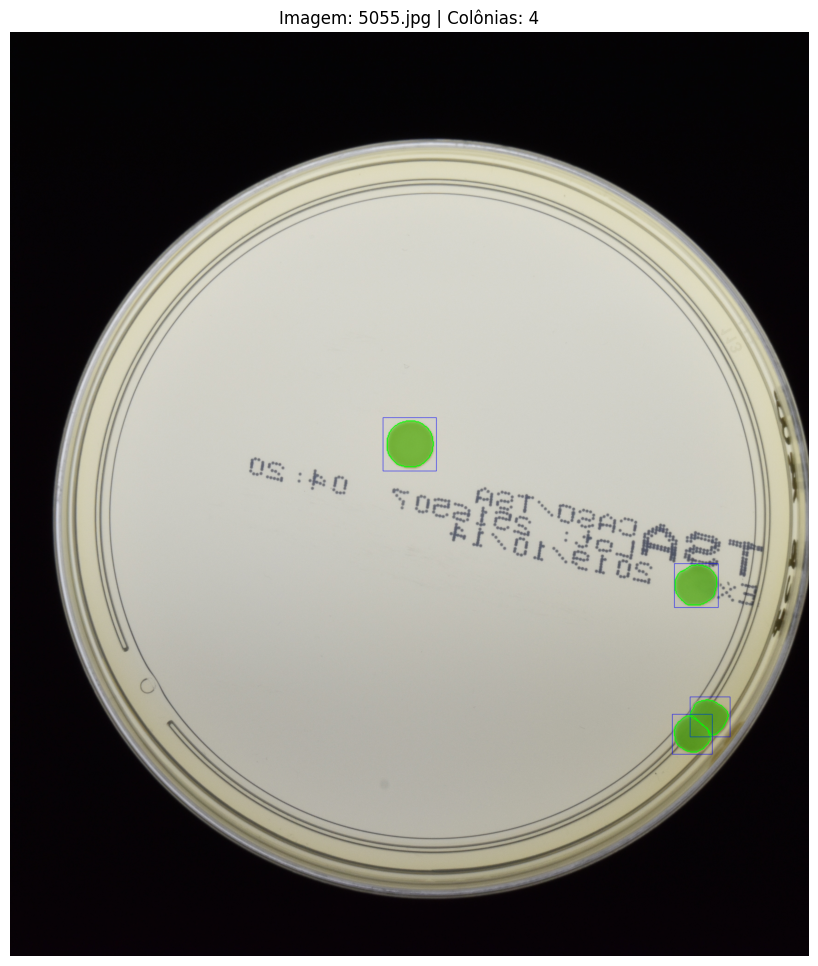

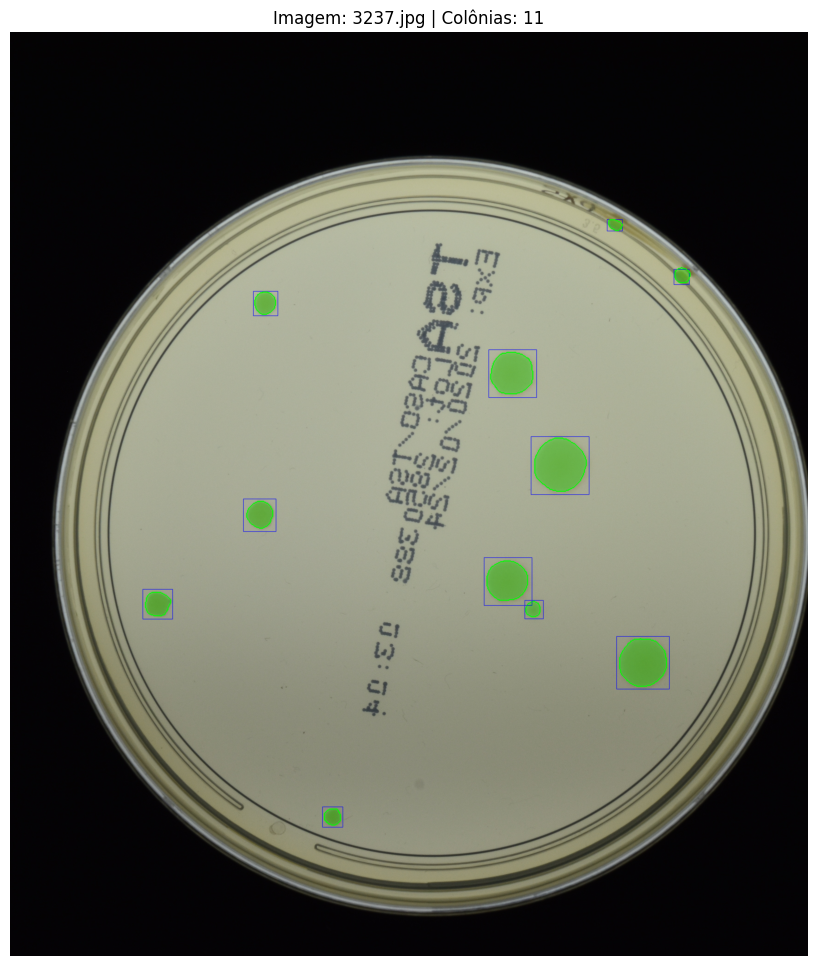

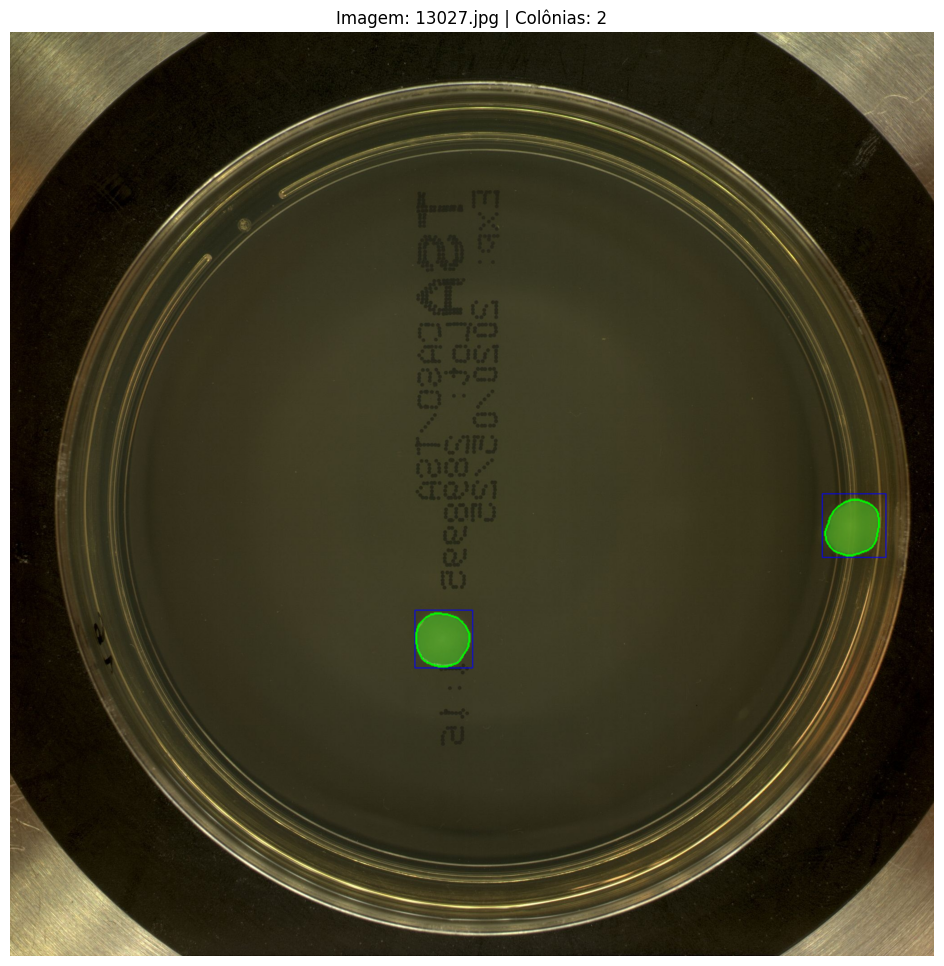

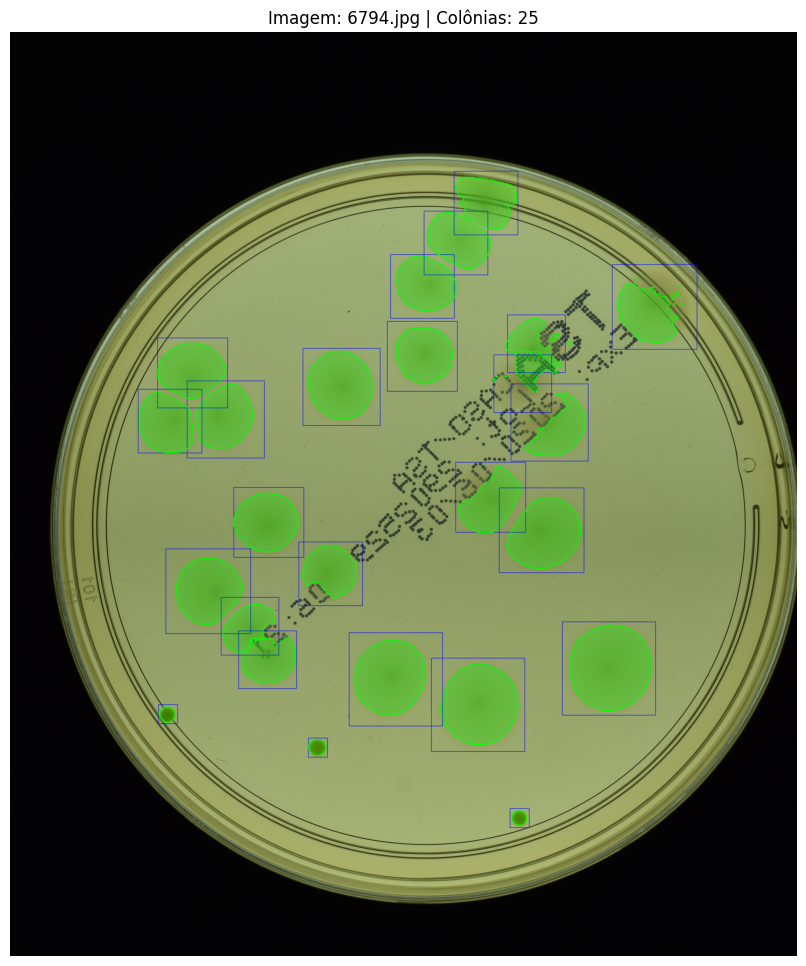

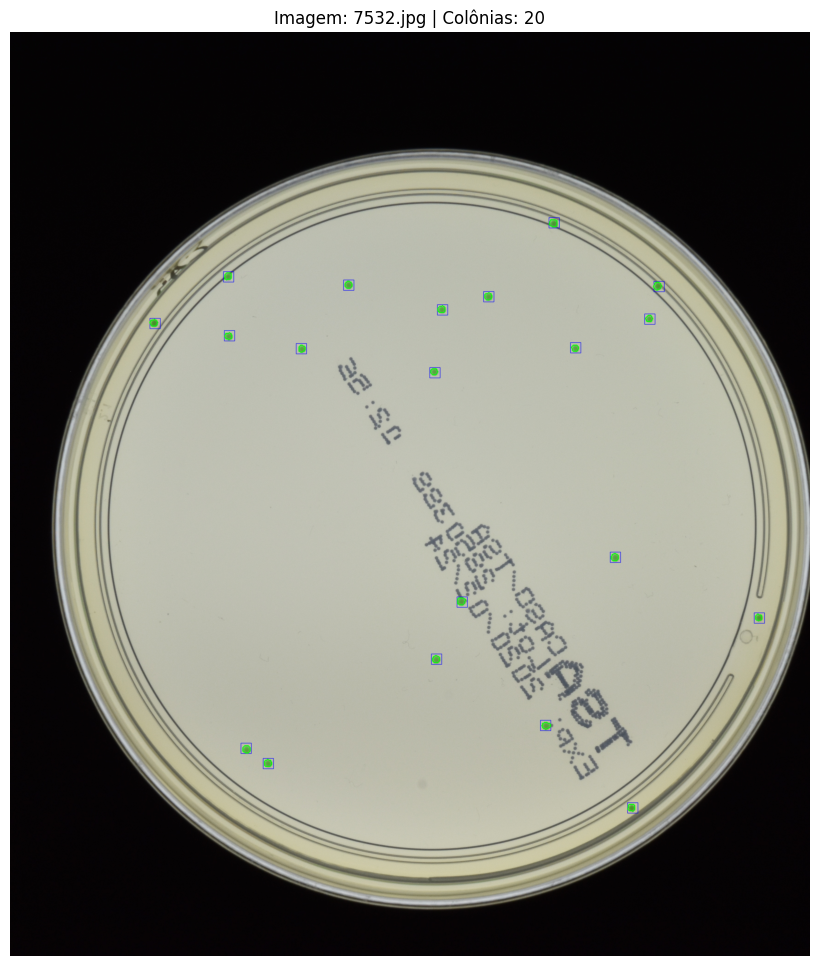

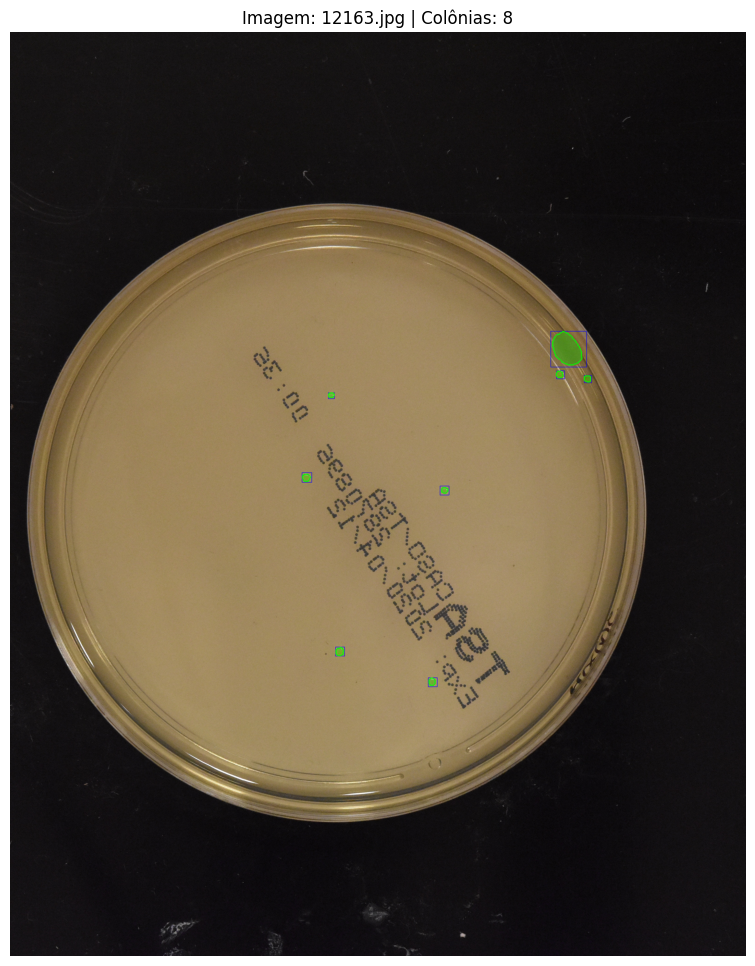

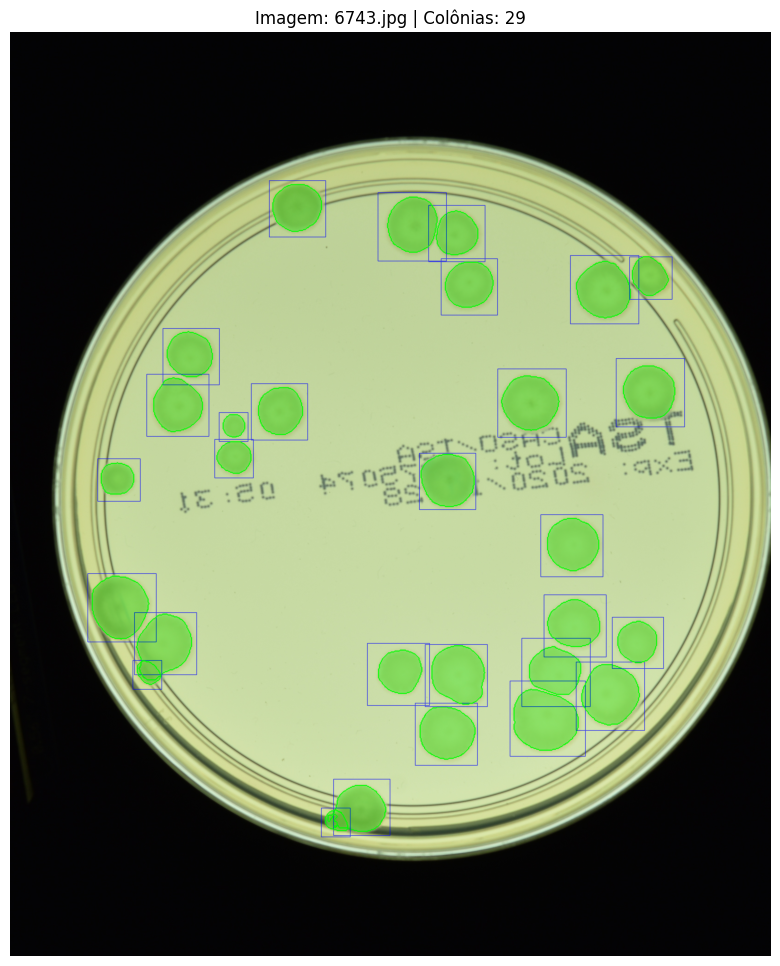

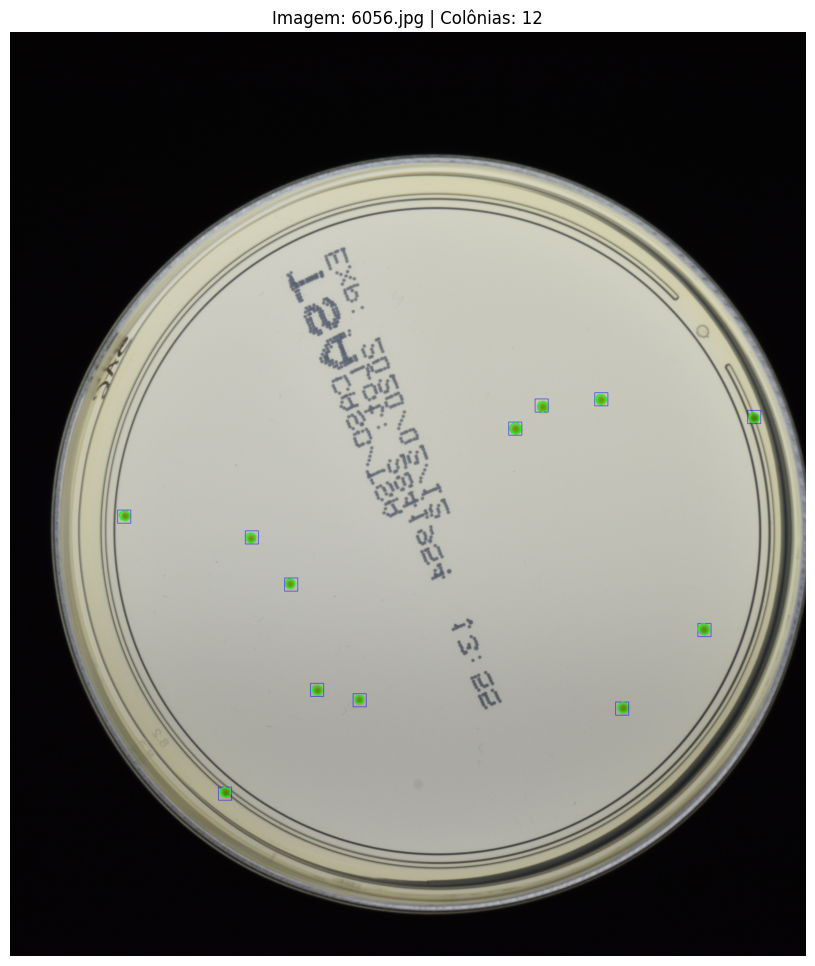

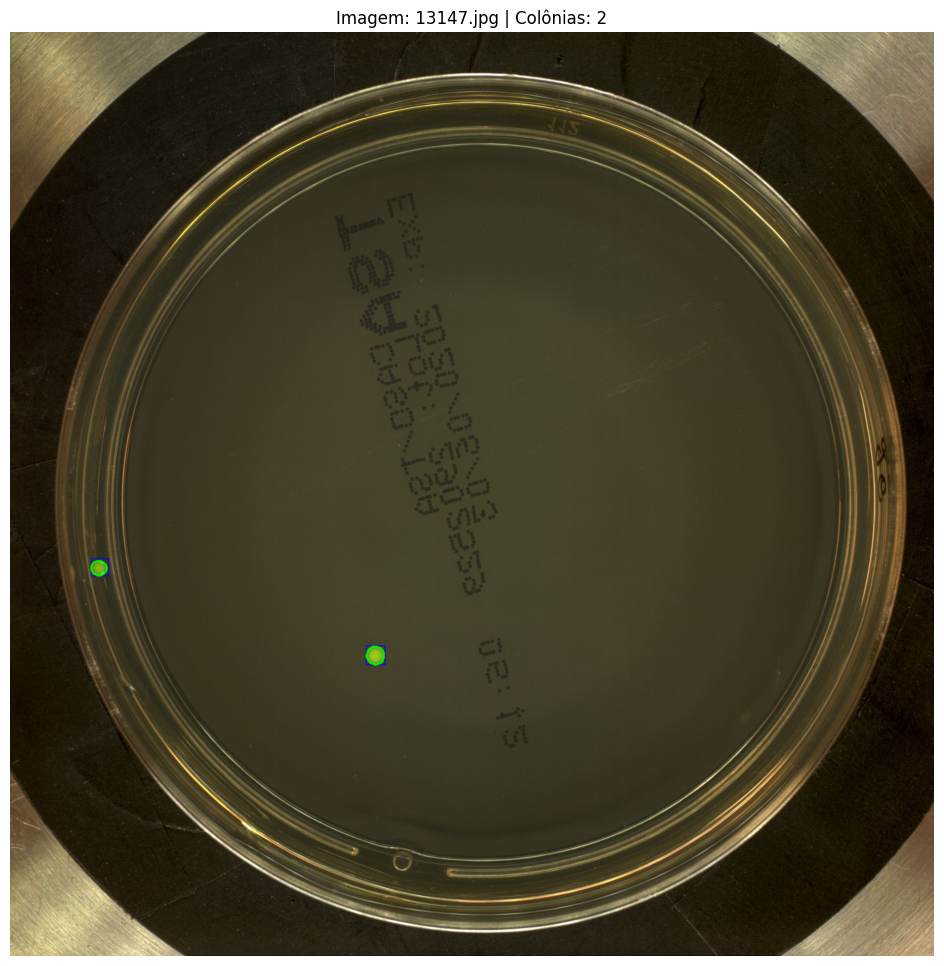

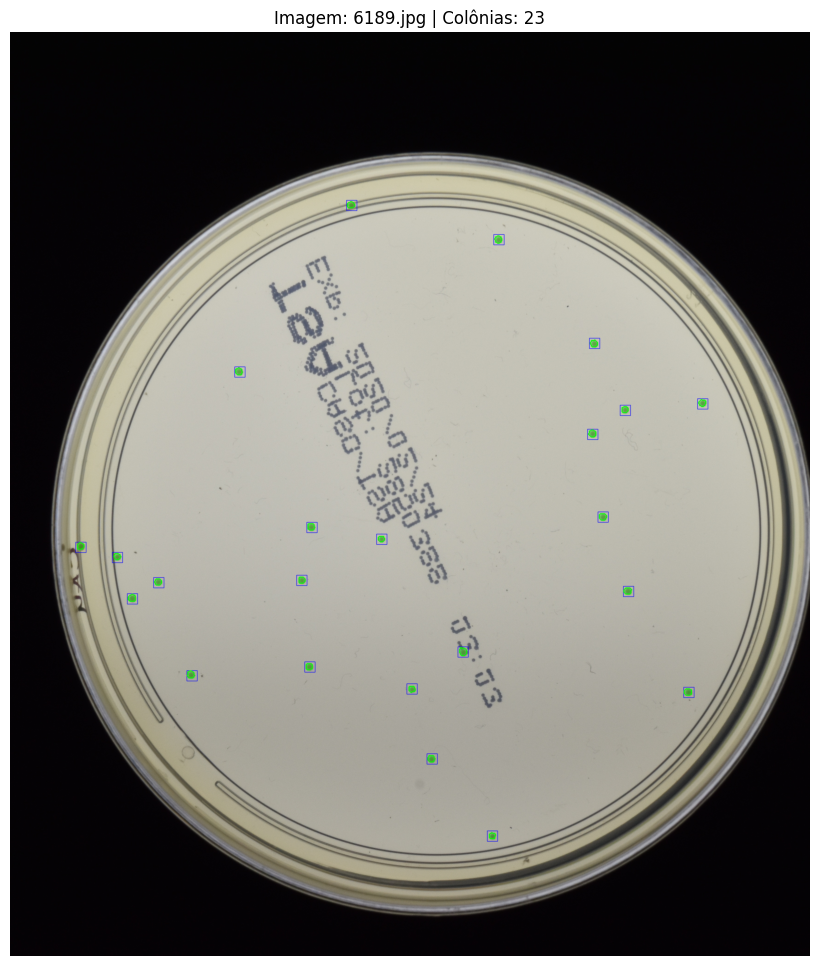

In [ ]:
import json
import os
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np

# --- CONFIGURAÇÕES ---
CAMINHO_JSON_CHECKPOINT = '/content/drive/MyDrive/AGAR/annotations_agar_segmentado.json'
DIRETORIO_IMAGENS = '/content/agar/dataset' # Ajuste se necessário
NUM_IMAGENS_PARA_VER = 10 # Quantas imagens sortear

def visualizar_segmentacao(caminho_json, pasta_imagens, num_amostras=3, SEED=42):
    if not os.path.exists(caminho_json):
        print(f"❌ Arquivo não encontrado: {caminho_json}")
        return

    with open(caminho_json, 'r') as f:
        data = json.load(f)

    # Filtrar apenas as anotações que já possuem a nossa flag do SAM
    anotacoes_com_seg = [ann for ann in data['annotations'] if ann.get('sam_processed') == True]

    if not anotacoes_com_seg:
        print("⚠️ Nenhuma imagem processada pelo SAM foi encontrada no JSON ainda.")
        return

    # Pegar IDs únicos de imagens que já foram processadas
    image_ids_processados = list(set(ann['image_id'] for ann in anotacoes_com_seg))
    random.seed(SEED)
    amostra_ids = random.sample(image_ids_processados, min(len(image_ids_processados), num_amostras))

    # Mapeamento de imagens
    img_map = {img['id']: img for img in data['images']}

    for img_id in amostra_ids:
        img_info = img_map[img_id]
        img_path = os.path.join(pasta_imagens, img_info['file_name'])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        overlay = image.copy()

        # Filtrar anotações desta imagem específica
        anns_da_img = [ann for ann in anotacoes_com_seg if ann['image_id'] == img_id]

        for ann in anns_da_img:
            # 1. Desenhar a Bounding Box original (Azul)
            x, y, w, h = [int(v) for v in ann['bbox']]
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

            # 2. Desenhar os Polígonos da Segmentação (Verde)
            for seg in ann['segmentation']:
                poly = np.array(seg).reshape((len(seg) // 2, 2)).astype(np.int32)
                cv2.polylines(image, [poly], True, (0, 255, 0), 3)
                cv2.fillPoly(overlay, [poly], (0, 255, 0))

        # Misturar a imagem original com o preenchimento da segmentação
        alpha = 0.3
        image_final = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        plt.figure(figsize=(12, 12))
        plt.imshow(image_final)
        plt.title(f"Imagem: {img_info['file_name']} | Colônias: {len(anns_da_img)}")
        plt.axis('off')
        plt.show()

# Executar visualização
visualizar_segmentacao(CAMINHO_JSON_CHECKPOINT, DIRETORIO_IMAGENS, NUM_IMAGENS_PARA_VER, SEED=90)

In [ ]:
from google.colab import runtime
runtime.unassign()